# Importing Libraries

In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# 1. Load All Images from a Folder

In [2]:
def load_images_from_folder(folder_path):
    images = []
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
        if image is not None:
            images.append((filename, image))
    return images

# 2. Histogram Equalization

In [3]:
def apply_histogram_equalization(image):
    return cv2.equalizeHist(image)

# 3. Edge Detection Using Sobel Operator

In [4]:
def apply_sobel_edge_detection(image):
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = cv2.magnitude(sobel_x, sobel_y)
    return np.uint8(sobel_combined)

# 4. Image Smoothing (Gaussian Filter)

In [5]:
def apply_smoothing_filter(image, kernel_size=5):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

# 5. Image Sharpening (Using Kernel)

In [6]:
def apply_sharpening_filter(image):
    kernel = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]])
    return cv2.filter2D(image, -1, kernel)

# 6. Process and Display Results

Processing: barbara.tif


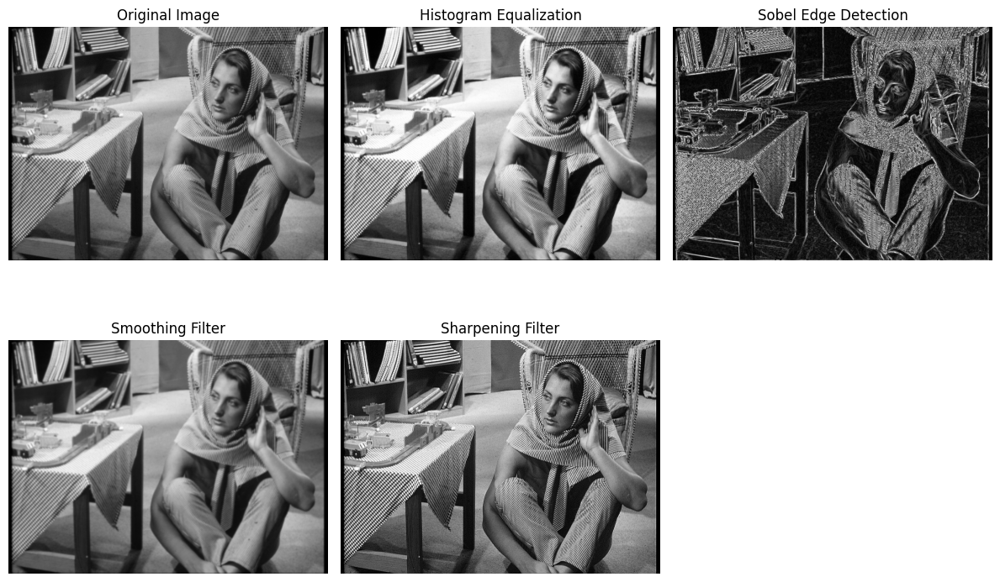

Processing: boat.jpeg


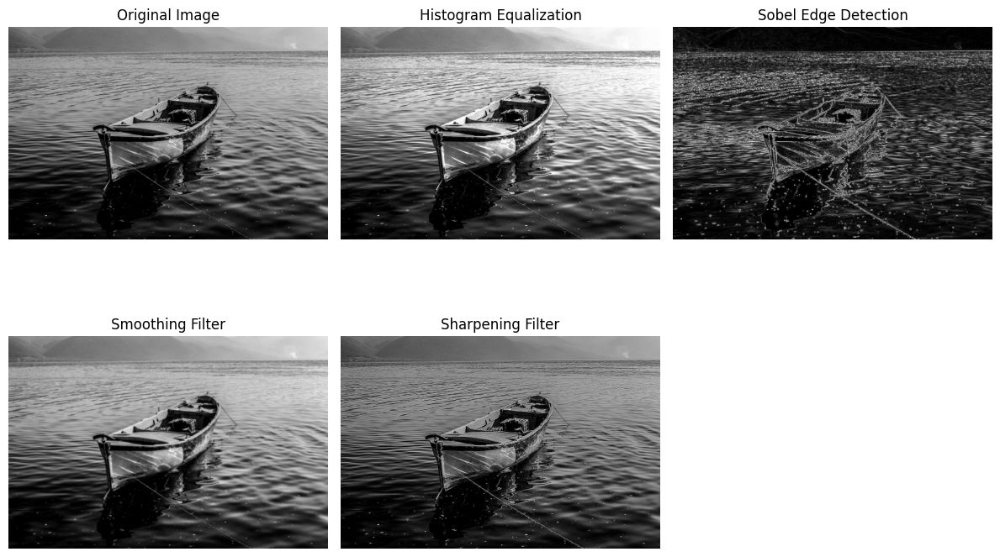

Processing: cameraman.tif


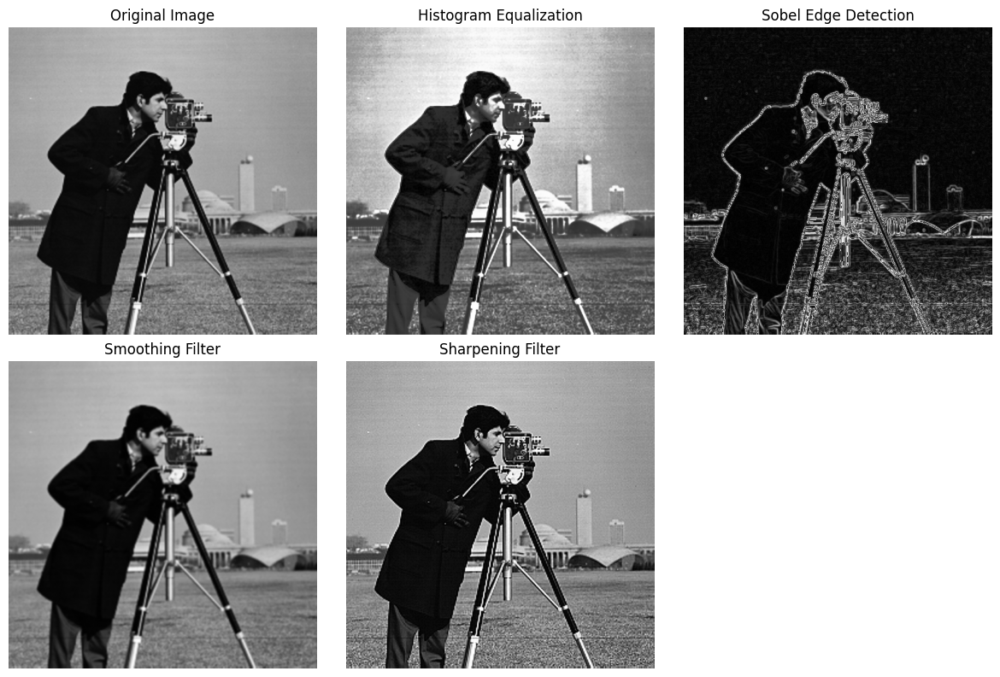

Processing: house.tif


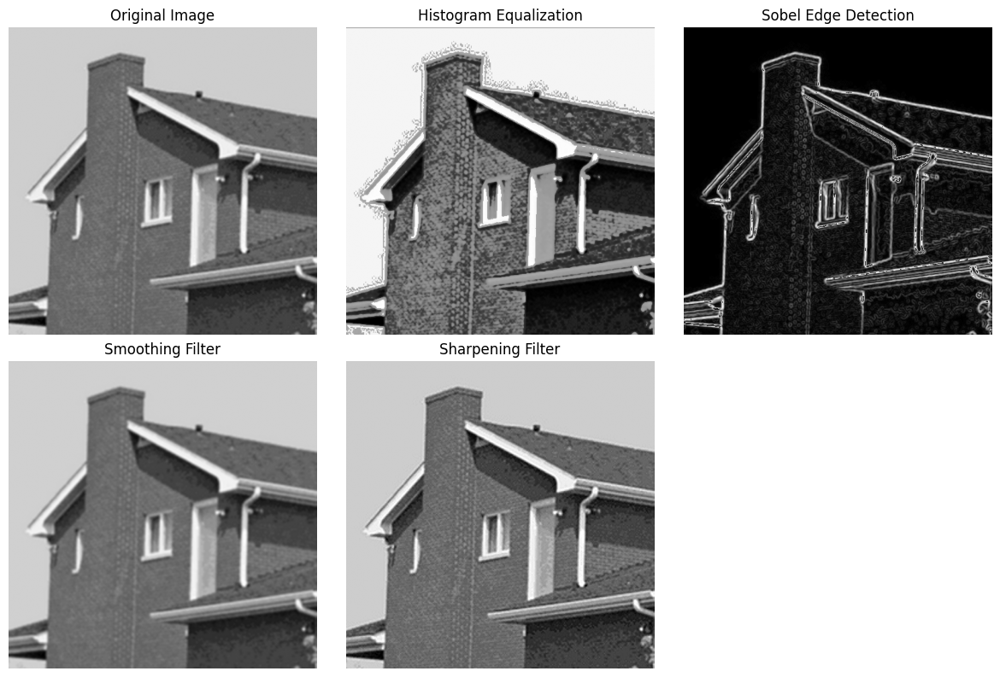

Processing: jetplane.tif


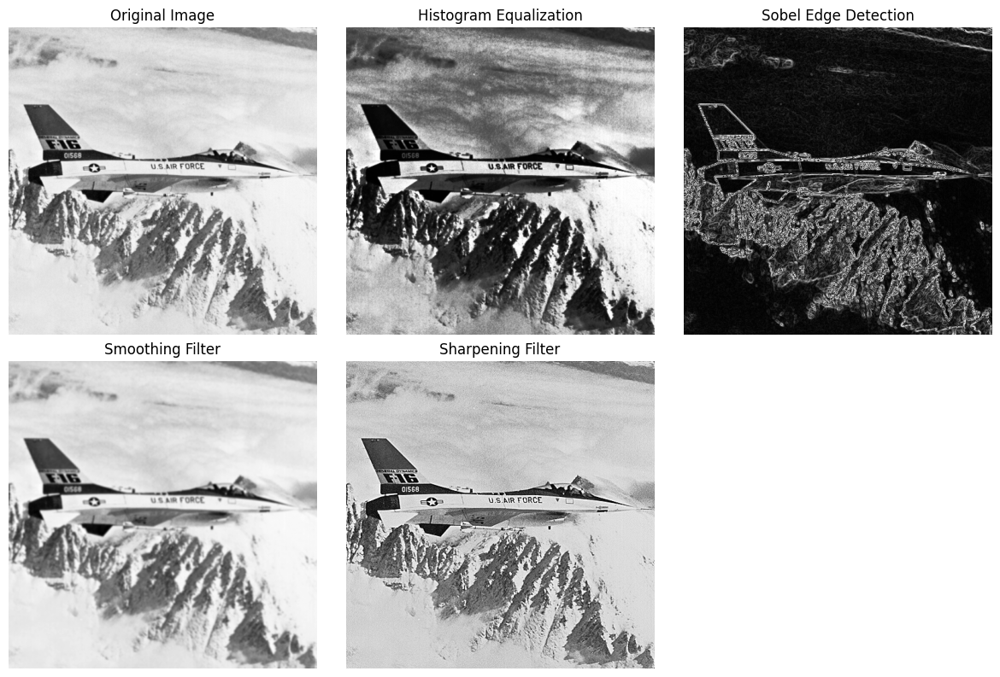

Processing: lake.tif


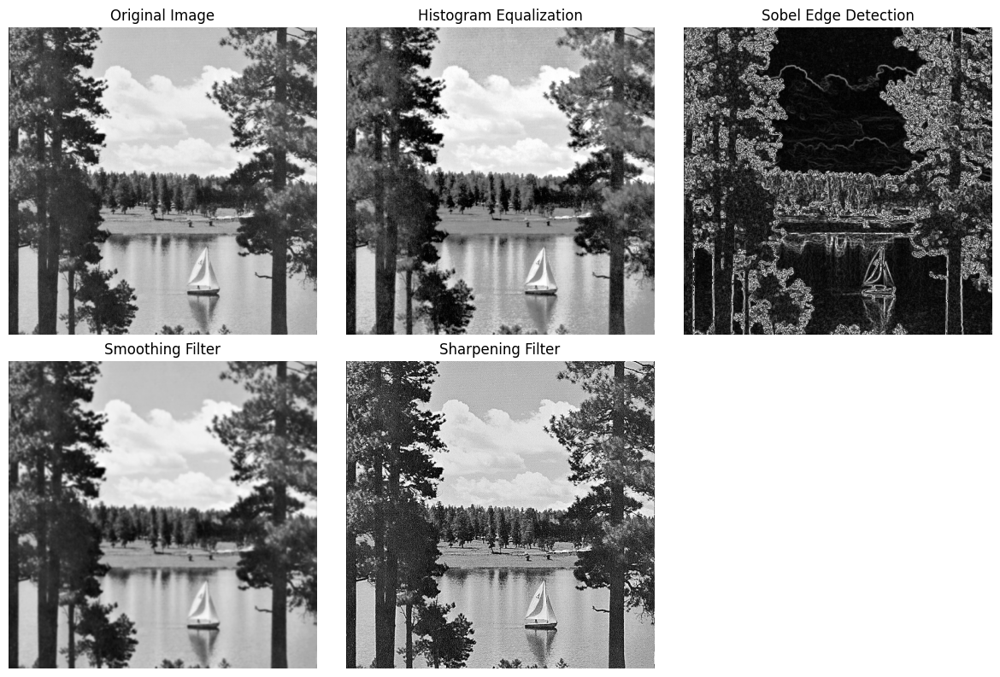

Processing: lena_color_512.tif


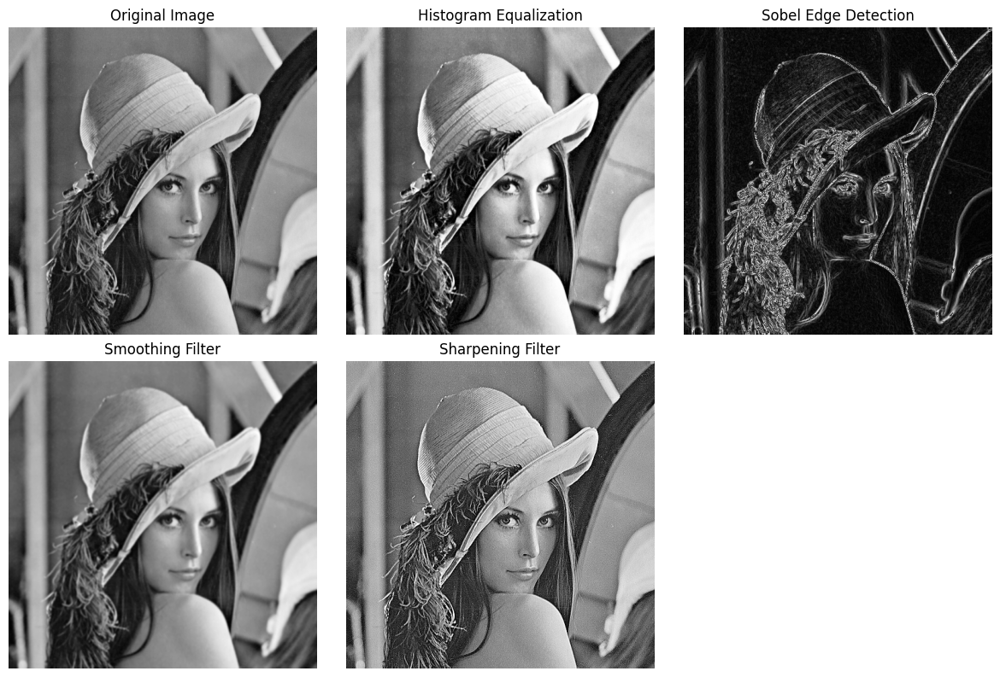

Processing: lena_gray_512.tif


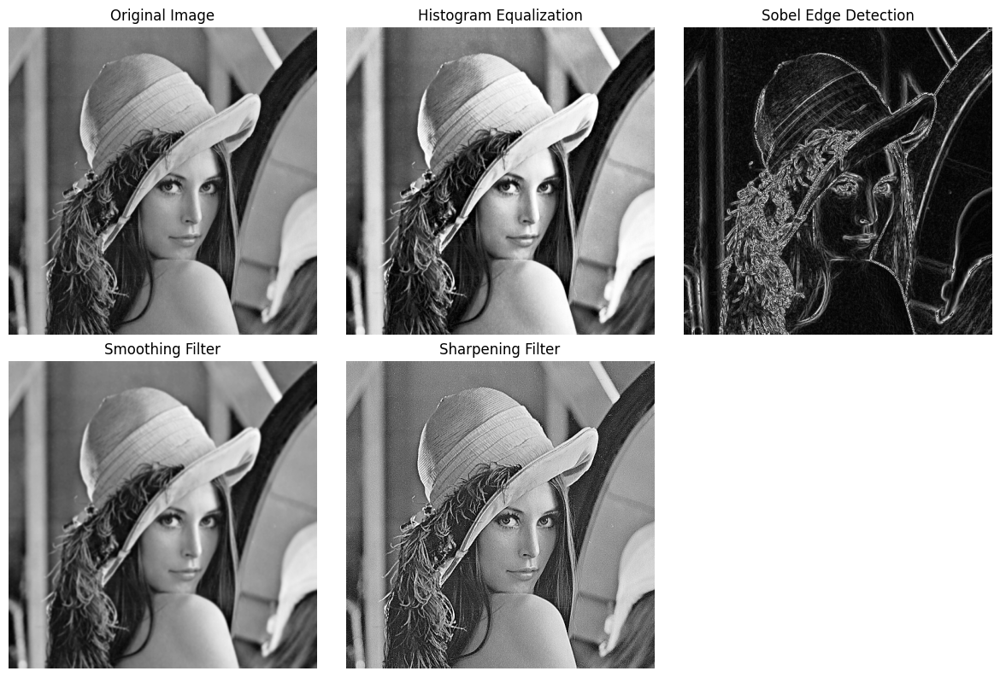

Processing: livingroom.tif


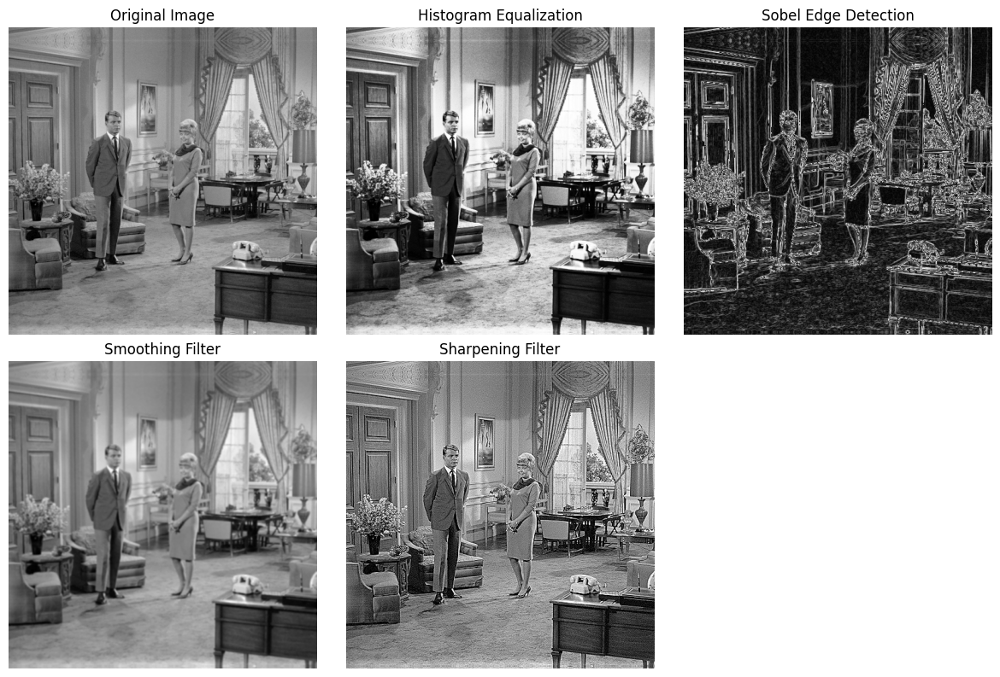

Processing: mandril_color.tif


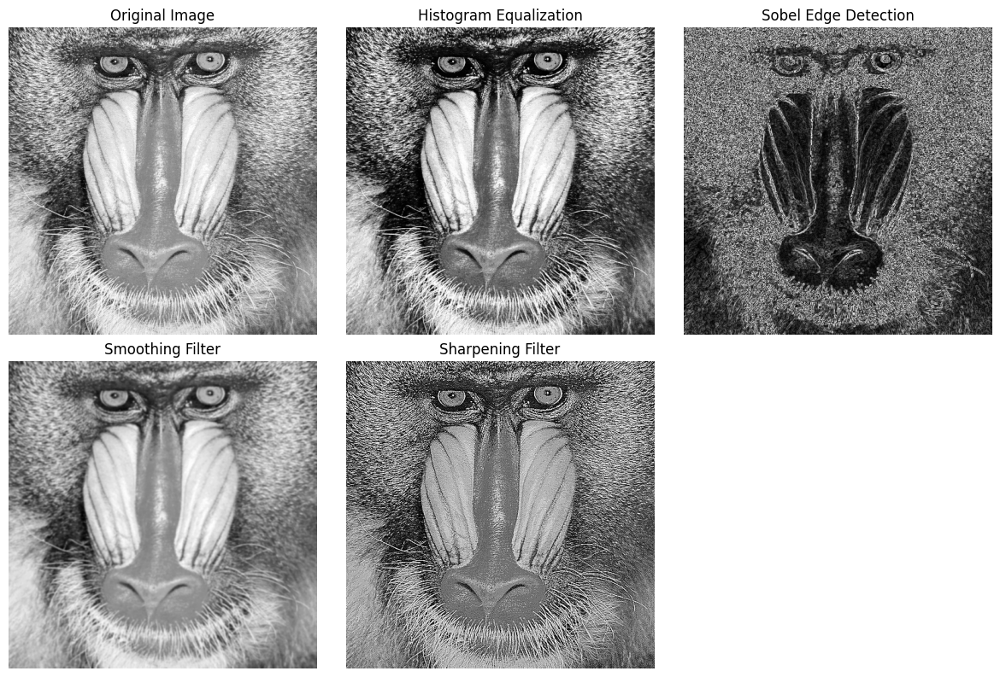

Processing: mandril_gray.tif


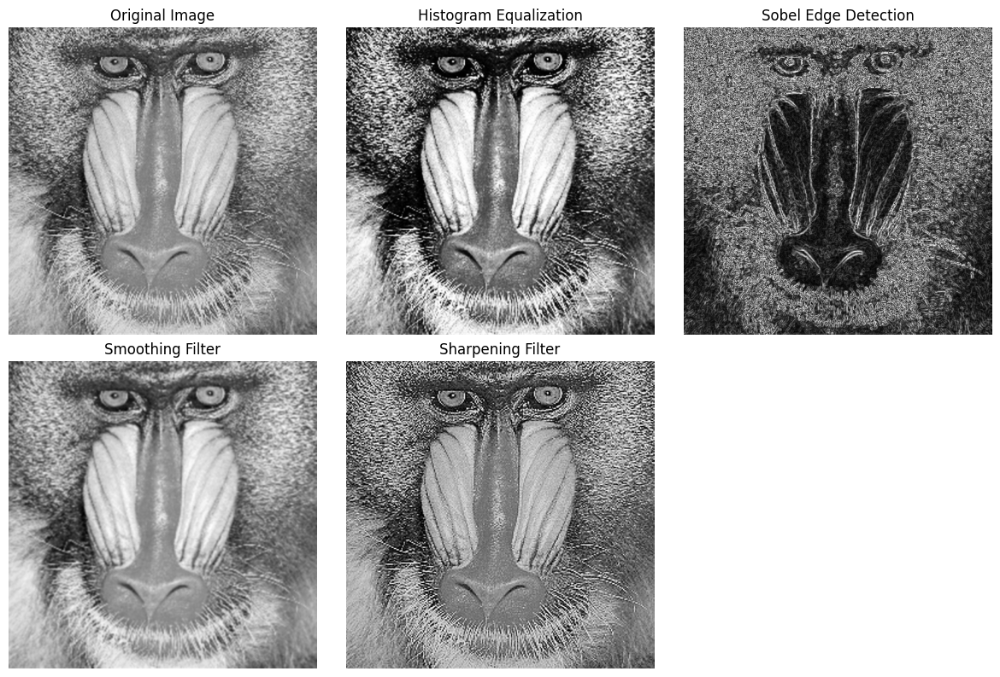

Processing: peppers_color.tif


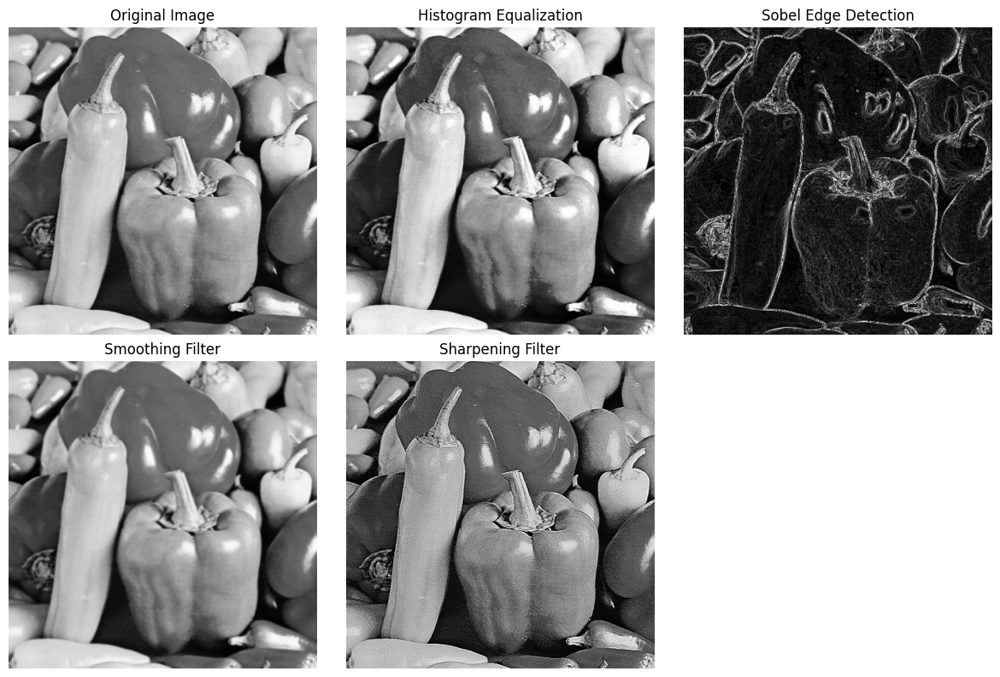

Processing: peppers_gray.tif


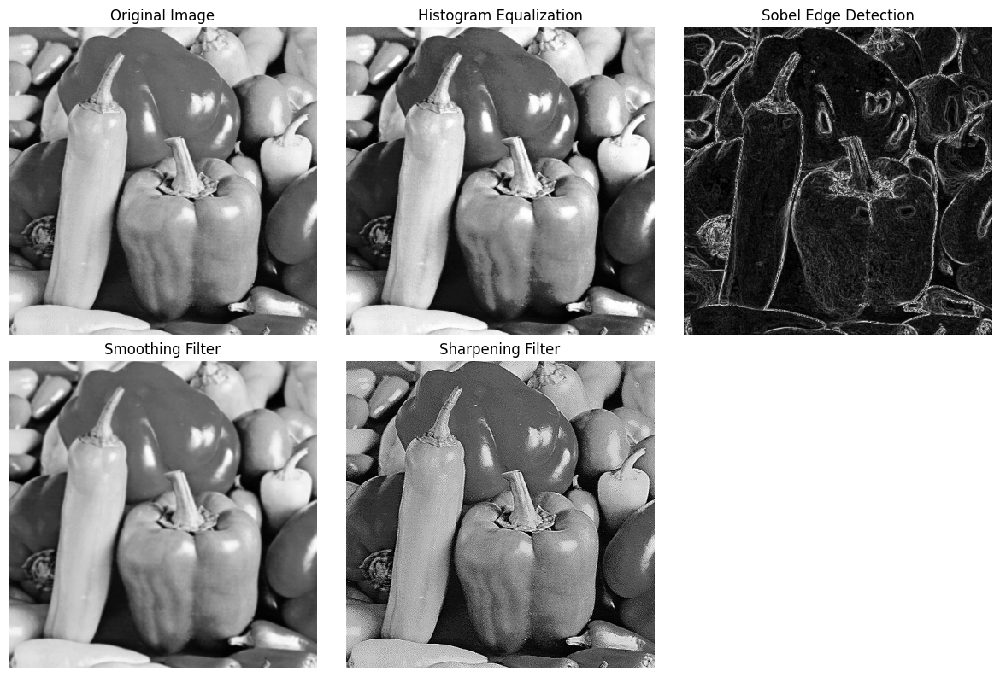

Processing: pirate.tif


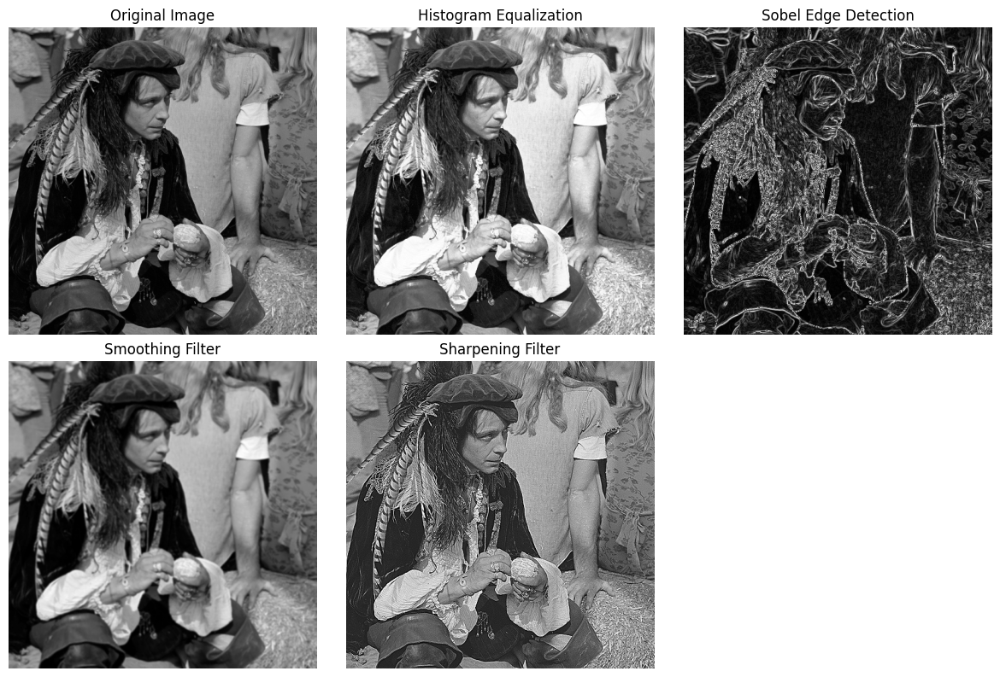

In [ ]:
def process_images(folder_path):
    images = load_images_from_folder(folder_path)

    for filename, image in images:
        print(f"Processing: {filename}")

        # Histogram Equalization
        hist_eq_image = apply_histogram_equalization(image)

        # Edge Detection
        sobel_edges = apply_sobel_edge_detection(image)

        # Smoothing Filter
        smoothed_image = apply_smoothing_filter(image)

        # Sharpening Filter
        sharpened_image = apply_sharpening_filter(image)

        # Display Results
        plt.figure(figsize=(12, 8))

        plt.subplot(2, 3, 1)
        plt.imshow(image, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, 3, 2)
        plt.imshow(hist_eq_image, cmap='gray')
        plt.title("Histogram Equalization")
        plt.axis('off')

        plt.subplot(2, 3, 3)
        plt.imshow(sobel_edges, cmap='gray')
        plt.title("Sobel Edge Detection")
        plt.axis('off')

        plt.subplot(2, 3, 4)
        plt.imshow(smoothed_image, cmap='gray')
        plt.title("Smoothing Filter")
        plt.axis('off')

        plt.subplot(2, 3, 5)
        plt.imshow(sharpened_image, cmap='gray')
        plt.title("Sharpening Filter")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

# Define the folder path
input_folder = "standard-test" 
process_images(input_folder)

# My comments

Histogram equalization improves the contrast of the image, making darker areas brighter and details more visible. It’s particularly helpful when the original image has uneven lighting or poor contrast, like in the hair and facial features here.

Edge detection using the Sobel operator highlights the edges by identifying areas where there’s a significant change in intensity, like the outline of the face, hair, and clothing. While it works well for detecting prominent boundaries, it doesn’t enhance the overall image, and it can sometimes make the image appear harsher.

The smoothing filter, or Gaussian blur, reduces noise and softens the image. You can see that it creates a cleaner and smoother look, but it also makes edges and details slightly less sharp.

The sharpening filter does the opposite, it enhances edges and makes features like the face and hair more defined. It’s useful when you want to emphasize details, but it can also exaggerate noise if the image isn’t clean.

Each method has its strengths and limitations. Histogram equalization is great for improving visibility, Sobel is perfect for finding edges, smoothing is useful for reducing noise, and sharpening makes details pop. They’re all effective, depending on what you need from the image.